<a href="https://colab.research.google.com/github/rocx320/ImageAnalytics/blob/main/2247226_IA_LAB7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Function to extract features from an image
def extract_features(image):
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Resize the image to a fixed size (if needed)
    resized_image = cv2.resize(gray_image, (100, 100))

    # Calculate statistical features
    mean = np.mean(resized_image)
    std = np.std(resized_image)
    min_val = np.min(resized_image)
    max_val = np.max(resized_image)

    # Flatten the image into a 1D array
    flattened_image = resized_image.flatten()

    # Concatenate the features into a feature vector
    feature_vector = np.concatenate((flattened_image, [mean, std, min_val, max_val]))

    return feature_vector

# Load and preprocess the dataset
image_paths = [
    '/content/7.jpg',
    '/content/8.jpg',
    '/content/9.jpg',
    '/content/10.jpg',
    '/content/11.jpg',
    '/content/12.jpg',
    '/content/13.jpg',
    '/content/14.jpg',
    '/content/15.jpg',
    '/content/16.jpg',
    '/content/17.jpg'

    # Add more image paths here
]

images = []
labels = []

for image_path in image_paths:
    image = cv2.imread(image_path)
    features = extract_features(image)
    images.append(features)

    # Extract the noise type from the image path or any other way
    # label = extract_label(image_path)
    # labels.append(label)


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix

# Function to generate noisy images
def generate_noisy_image(image, noise_type, noise_amount):
    noisy_image = image.copy().astype(np.float32)

    if noise_type == 'gaussian':
        noise = np.random.normal(0, noise_amount, image.shape).astype(np.float32)
        noisy_image += noise
    elif noise_type == 'salt_and_pepper':
        mask = np.random.choice([0, 1, 255], image.shape, p=[noise_amount/2, noise_amount/2, 1 - noise_amount]).astype(np.float32)
        noisy_image += mask
    elif noise_type == 'speckle':
        noise = noise_amount * np.random.randn(*image.shape).astype(np.float32)
        noisy_image += noisy_image * noise
    elif noise_type == 'poisson':
        noisy_image = np.random.poisson(image / 255.0 * noise_amount) / noise_amount * 255
    elif noise_type == 'uniform':
        noise = np.random.uniform(-noise_amount, noise_amount, image.shape).astype(np.float32)
        noisy_image += noise
        noisy_image = np.clip(noisy_image, 0, 255)

    return noisy_image.astype(np.uint8)

# Load a sample image
images = []
image_paths = [
    '/content/7.jpg',
    '/content/8.jpg',
    '/content/9.jpg',
    '/content/10.jpg',
    '/content/11.jpg',
    '/content/12.jpg',
    '/content/13.jpg',
    '/content/14.jpg',
    '/content/15.jpg',
    '/content/16.jpg',
    '/content/17.jpg'
]

for path in image_paths:
    print('Loading image from:', path)
    image = cv2.imread(path)
    if image is None:
        print('Error loading image from:', path)
    else:
        print('Successfully loaded image from:', path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        images.append(image)





Loading image from: /content/7.jpg
Successfully loaded image from: /content/7.jpg
Loading image from: /content/8.jpg
Successfully loaded image from: /content/8.jpg
Loading image from: /content/9.jpg
Successfully loaded image from: /content/9.jpg
Loading image from: /content/10.jpg
Successfully loaded image from: /content/10.jpg
Loading image from: /content/11.jpg
Successfully loaded image from: /content/11.jpg
Loading image from: /content/12.jpg
Successfully loaded image from: /content/12.jpg
Loading image from: /content/13.jpg
Successfully loaded image from: /content/13.jpg
Loading image from: /content/14.jpg
Successfully loaded image from: /content/14.jpg
Loading image from: /content/15.jpg
Successfully loaded image from: /content/15.jpg
Loading image from: /content/16.jpg
Successfully loaded image from: /content/16.jpg
Loading image from: /content/17.jpg
Successfully loaded image from: /content/17.jpg


In [ ]:

# Generate noisy images
noise_types = ['gaussian', 'salt_and_pepper', 'speckle', 'poisson', 'uniform']
noise_amounts = [0.1, 0.05, 0.2, 0.1, 0.2]  # Noise amounts for each type
noisy_images = [generate_noisy_image(image, noise_types[i], noise_amounts[i]) for i in range(len(noise_types))]

# Add the original image with no noise
noisy_images.append(image)

# Create labels for the noisy images
labels = ['Gaussian', 'Salt and Pepper', 'Speckle', 'Poisson', 'Uniform', 'Original (No Noise)']

# Preprocess the data
X = np.array(noisy_images).reshape(len(noisy_images), -1)
y = np.arange(len(labels))

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Random Forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy:', accuracy)



Accuracy: 0.0


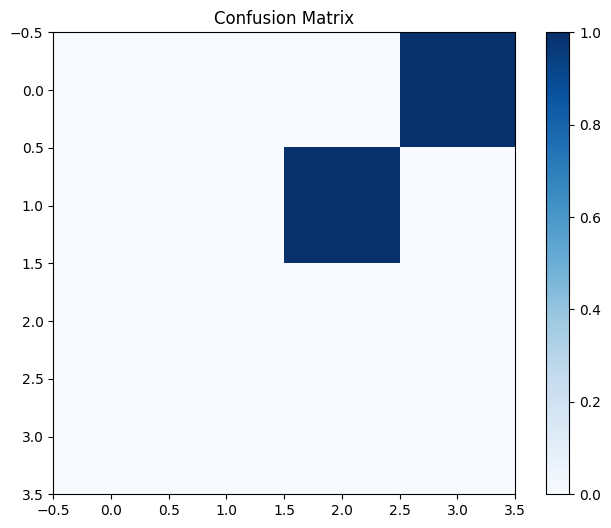

In [ ]:

# Create a confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()



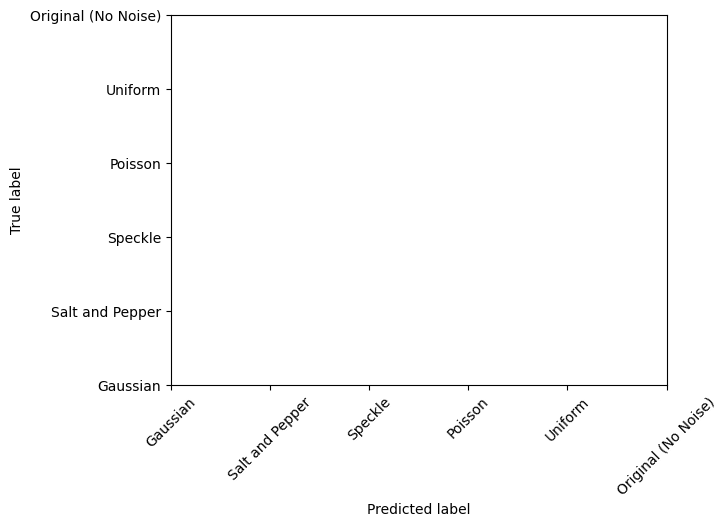

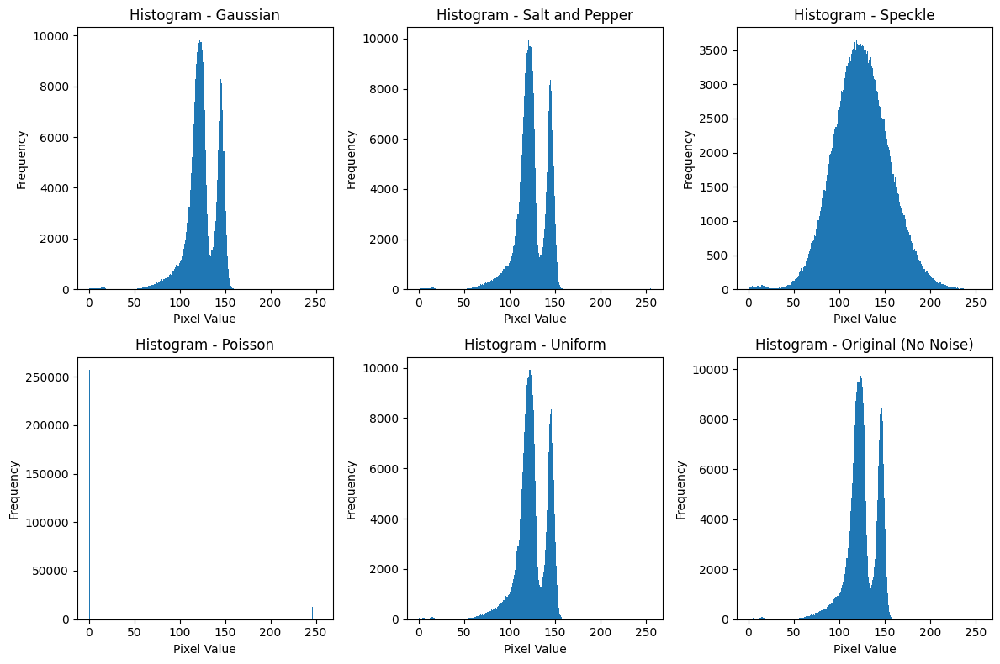

In [ ]:
tick_marks = np.arange(len(labels))
plt.xticks(tick_marks, labels, rotation=45)
plt.yticks(tick_marks, labels)

plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

# Create histograms for the original and noisy images
plt.figure(figsize=(12, 8))
for i in range(len(noisy_images)):
    plt.subplot(2, 3, i+1)
    plt.hist(noisy_images[i].ravel(), bins=256, range=[0, 256])
    plt.title('Histogram - ' + labels[i])
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image

In [ ]:
img=cv2.imread("input.jpg",0)

In [ ]:
print(img.shape)

(6240, 4160)




Gaussian noise is a statistical noise having the probability density function equal to that of a normal distribution. Random Gaussian function is added to Image function to generate this noise. Since it arises in amplifiers and detectors, it is also known as 'electronic noise'. It is caused by the discrete nature of radiation of warm objects.

To create the Gaussian noise, we first create a zero image with the same dimensions of the original image. We then use a random distribution to determine the pixel values of the noise (in this case with a mean of 128 and a sigma of 20)

In [ ]:
gauss_noise=np.zeros((6240, 4160),dtype=np.uint8)
cv2.randn(gauss_noise,128,20)
gauss_noise=(gauss_noise*0.5).astype(np.uint8)

In [ ]:
gn_img=cv2.add(img,gauss_noise)

Text(0.5, 1.0, 'Combined')

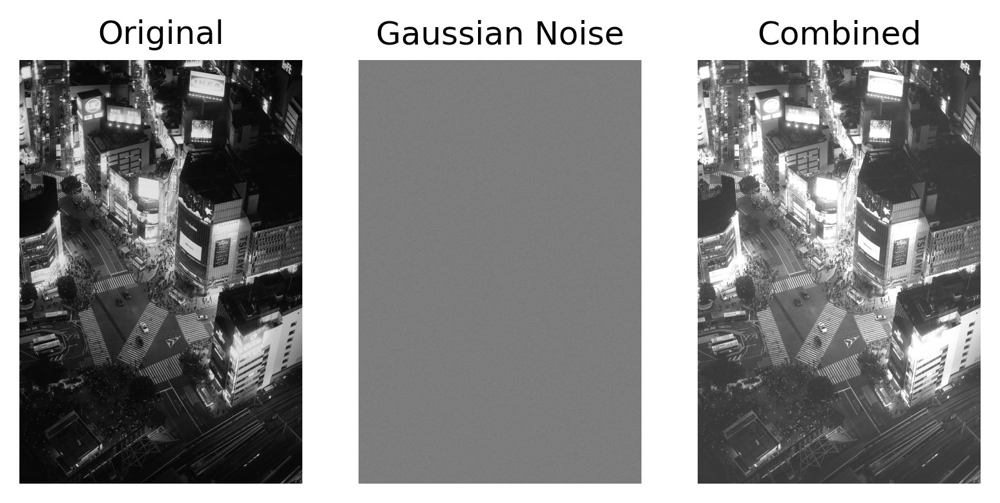

In [ ]:
fig=plt.figure(dpi=300)

fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(gauss_noise,cmap='gray')
plt.axis("off")
plt.title("Gaussian Noise")

fig.add_subplot(1,3,3)
plt.imshow(gn_img,cmap='gray')
plt.axis("off")
plt.title("Combined")

## Uniform Noise


Contrary to Gaussian noise, Uniform noise is a signal dependent (unless dithering is caused or applied) that follows a uniform distribution. It is caused by the quantization of the pixels of an image to a number of discrete levels. It is generally created when analog data is converted to digital form, and is not often encountered in real-world imaging systems.

To create a Uniform noise, we create a uniform distribution whose lower and upper bounds are the minimum and maximum pixel values (0 and 255 respectively) along the dimensions of the image.


In [ ]:
uni_noise=np.zeros((6240, 4160),dtype=np.uint8)
cv2.randu(uni_noise,0,255)
uni_noise=(uni_noise*0.5).astype(np.uint8)

In [ ]:
un_img=cv2.add(img,uni_noise)

Text(0.5, 1.0, 'Combined')

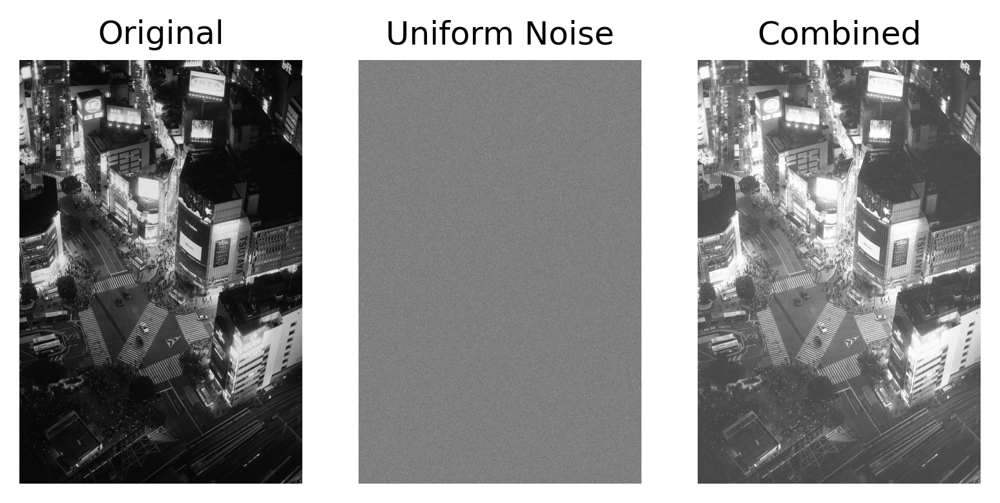

In [ ]:
fig=plt.figure(dpi=300)

fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(uni_noise,cmap='gray')
plt.axis("off")
plt.title("Uniform Noise")

fig.add_subplot(1,3,3)
plt.imshow(un_img,cmap='gray')
plt.axis("off")
plt.title("Combined")

Impulse Noise

To create a Salt and Pepper noise, we first create a distribution similar to that used in Uniform noise and apply binary thresholding to create a grid of black and white pixels. The intensity of the noise can be easily altered by changing the threshold value.

In [ ]:
imp_noise=np.zeros((6240, 4160),dtype=np.uint8)
cv2.randu(imp_noise,0,255)
imp_noise=cv2.threshold(imp_noise,245,255,cv2.THRESH_BINARY)[1]

In [ ]:
in_img=cv2.add(img,imp_noise)

Text(0.5, 1.0, 'Combined')

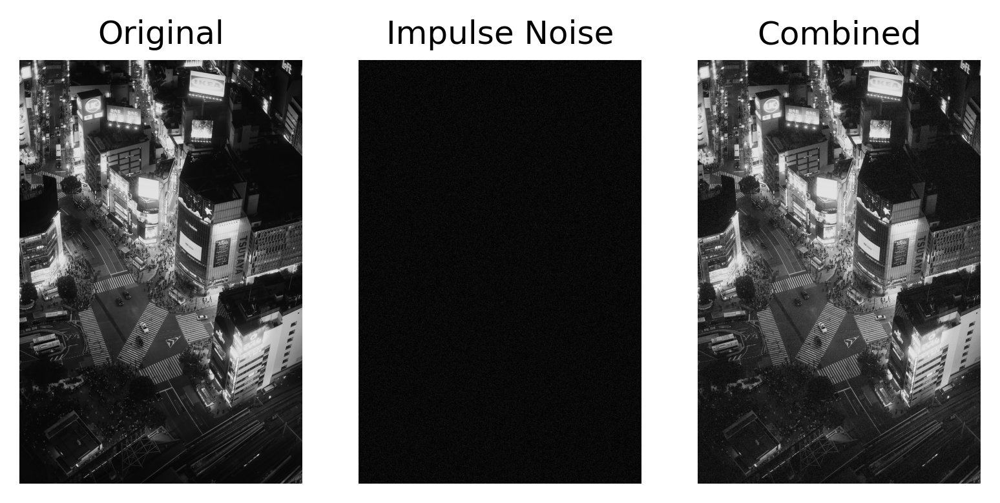

In [ ]:
fig=plt.figure(dpi=300)

fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(imp_noise,cmap='gray')
plt.axis("off")
plt.title("Impulse Noise")

fig.add_subplot(1,3,3)
plt.imshow(in_img,cmap='gray')
plt.axis("off")
plt.title("Combined")

Impulse or "Salt and Pepper" noise is the sparse occurance of maximum (255) and minimum (0) pixel values in an image. This can be noticed as the presence of black pixels in bright regions and white pixels in dark regions. This type of noise is caused due to sharp and sudden disturbances in the image signal, and is mainly generated by errors in analog to digital conversion or bit transmission.

Speckle Noise:

Speckle noise is another type of random noise that follows a multiplicative noise model.

In [ ]:
# Create an image with the same size as your previous impulse_noise
speckle_noise = np.zeros((6240, 4160), dtype=np.uint8)
cv2.randn(speckle_noise, 0, 32)  # Mean=0, StdDev=32
noisy_image_speckle = imp_noise + imp_noise * (speckle_noise / 255.0)

In [ ]:
noisy_image_speckle = noisy_image_speckle.astype(np.uint8)

# Add the images and explicitly specify the output data type
result = cv2.add(img, noisy_image_speckle, dtype=cv2.CV_8U)

sp_img=cv2.add(img,noisy_image_speckle)

Text(0.5, 1.0, 'Combined')

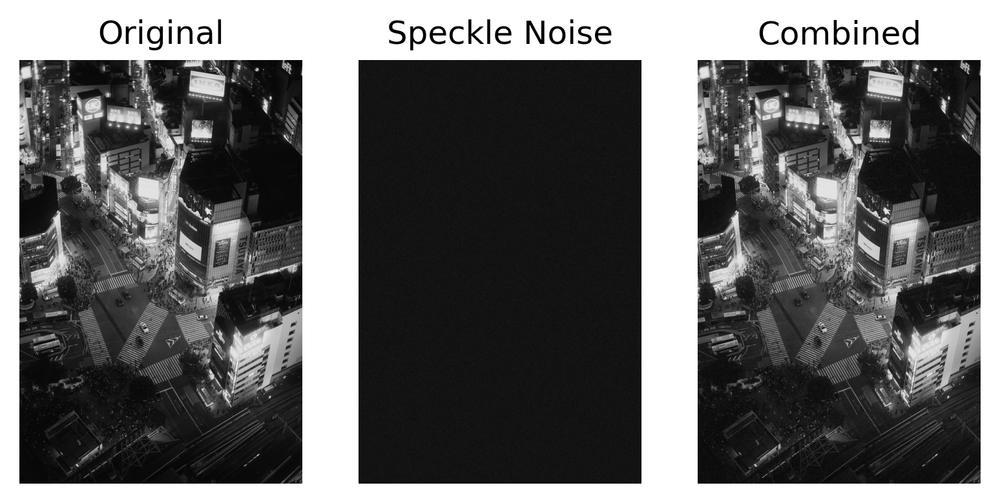

In [ ]:
fig=plt.figure(dpi=300)

fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(speckle_noise,cmap='gray')
plt.axis("off")
plt.title("Speckle Noise")

fig.add_subplot(1,3,3)
plt.imshow(sp_img,cmap='gray')
plt.axis("off")
plt.title("Combined")

Periodic Noise:

Periodic noise is often caused by interference patterns or regular structures in images.

In [ ]:
# Create an image with the same size as your previous impulse_noise
periodic_noise = np.zeros((6240, 4160), dtype=np.uint8)
for x in range(640):
    for y in range(480):
        periodic_noise[x, y] = 128 + 127 * np.sin(2 * np.pi * x / 32)

In [ ]:
per_img=cv2.add(img,periodic_noise)

Text(0.5, 1.0, 'Combined')

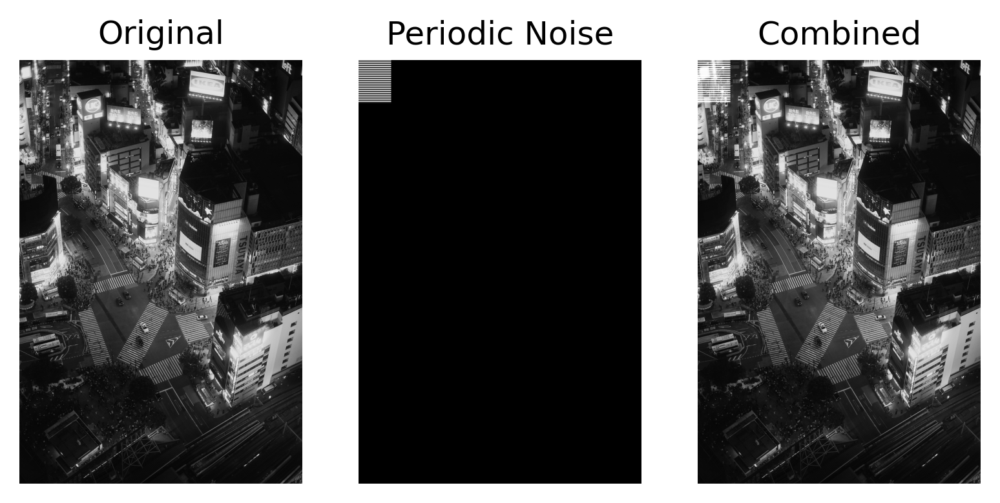

In [ ]:
fig=plt.figure(dpi=300)

fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(periodic_noise,cmap='gray')
plt.axis("off")
plt.title("Periodic Noise")

fig.add_subplot(1,3,3)
plt.imshow(per_img,cmap='gray')
plt.axis("off")
plt.title("Combined")

Poisson Noise:

Poisson noise is a type of noise that occurs when the number of photons hitting a photosensitive element (e.g., in a digital camera sensor) follows a Poisson distribution. It is common in low-light imaging conditions. Poisson noise can result in image artifacts such as random variations in brightness.

In [ ]:
# Define the scaling factor (adjust as needed)
scaling_factor = 10

# Generate Poisson noise
poisson_noise = np.random.poisson(img / scaling_factor) * scaling_factor


In [ ]:
poisson_noise = poisson_noise.astype(np.uint8)
poi_img=cv2.add(img, poisson_noise)


Text(0.5, 1.0, 'Combined')

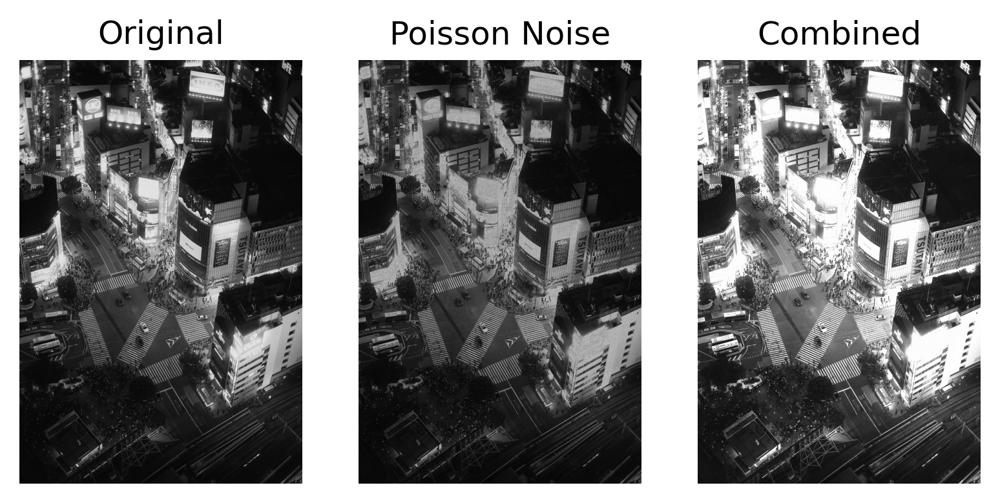

In [ ]:
fig=plt.figure(dpi=300)

fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(poisson_noise,cmap='gray')
plt.axis("off")
plt.title("Poisson Noise")

fig.add_subplot(1,3,3)
plt.imshow(poi_img,cmap='gray')
plt.axis("off")
plt.title("Combined")

## Removing Noise from Image

Text(0.5, 1.0, 'After Denoising')

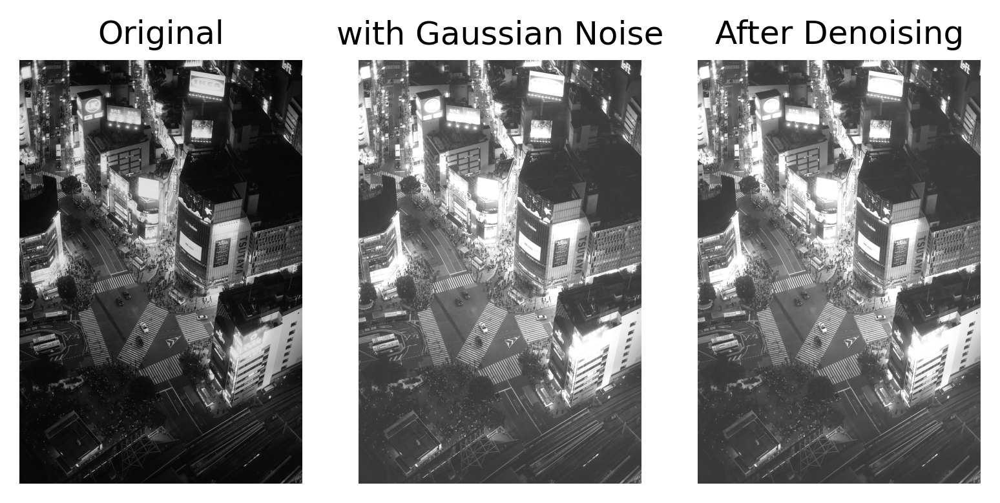

In [ ]:
denoised1=cv2.fastNlMeansDenoising(gn_img,None,10,10)

fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(gn_img,cmap='gray')
plt.axis("off")
plt.title("with Gaussian Noise")

fig.add_subplot(1,3,3)
plt.imshow(denoised1,cmap='gray')
plt.axis("off")
plt.title("After Denoising")

Text(0.5, 1.0, 'After Denoising')

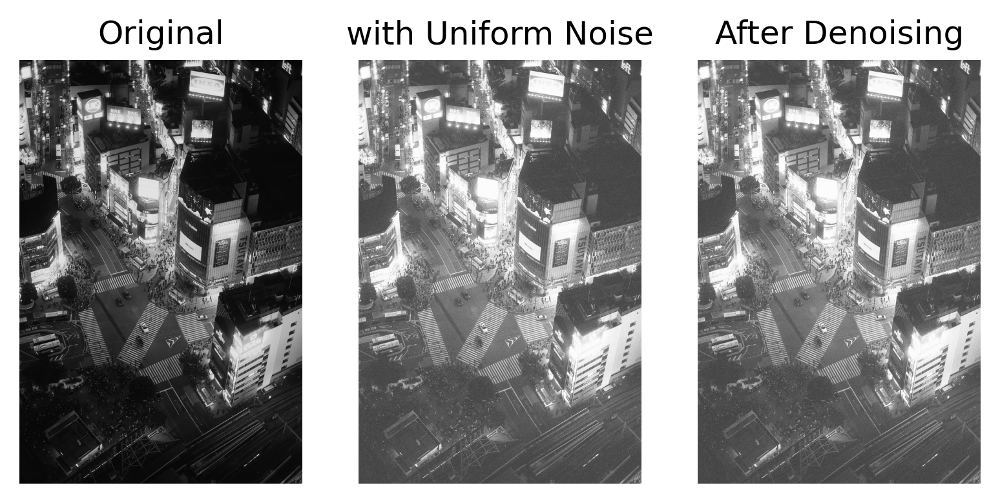

In [ ]:
denoised2=cv2.fastNlMeansDenoising(un_img,None,10,10)

fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(un_img,cmap='gray')
plt.axis("off")
plt.title("with Uniform Noise")

fig.add_subplot(1,3,3)
plt.imshow(denoised2,cmap='gray')
plt.axis("off")
plt.title("After Denoising")

Text(0.5, 1.0, 'After Denoising')

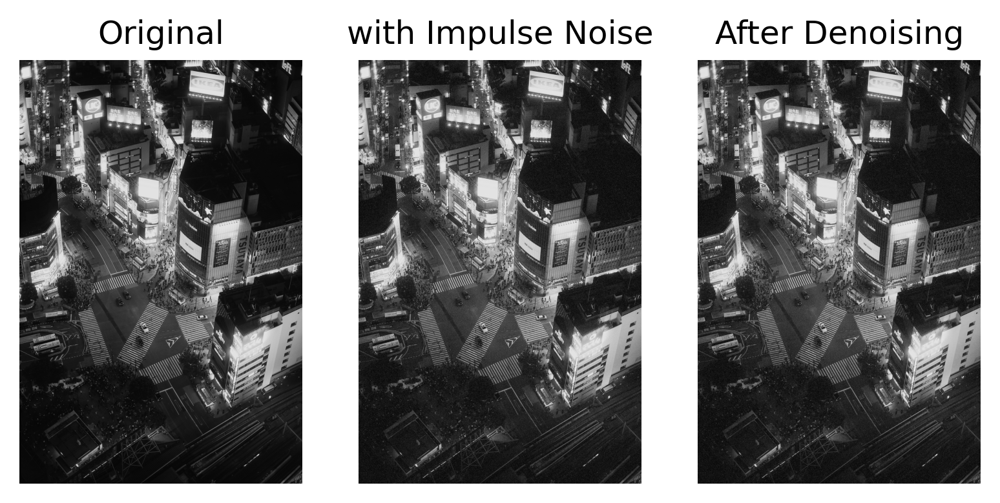

In [ ]:
denoised3=cv2.fastNlMeansDenoising(in_img,None,10,10)

fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(in_img,cmap='gray')
plt.axis("off")
plt.title("with Impulse Noise")

fig.add_subplot(1,3,3)
plt.imshow(denoised3,cmap='gray')
plt.axis("off")
plt.title("After Denoising")

 Slightly effective against Gaussian Noise.

## Using Median Blur

The Median Filter takes all the pixels under a kernel area and replaces the center element with the median value. It is meant to be highly effective against Impulse noise.


Text(0.5, 1.0, 'Median Filter')

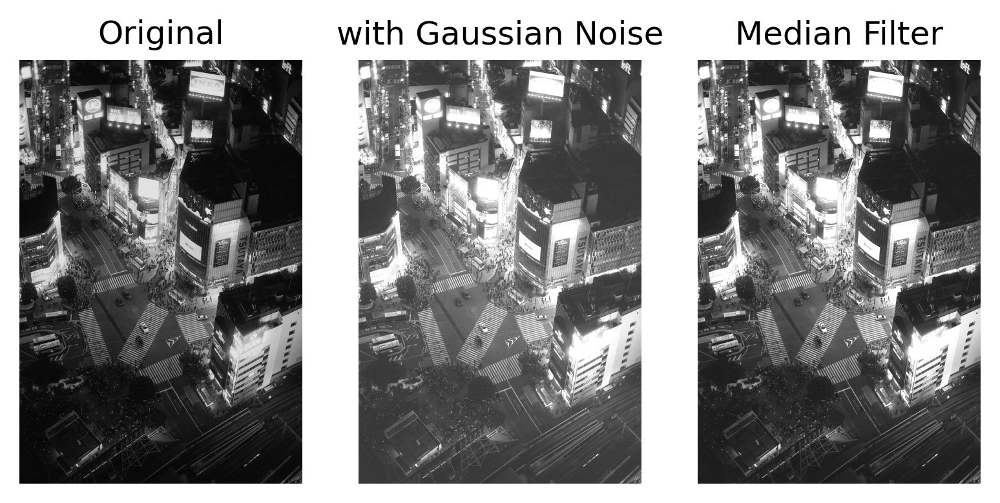

In [ ]:
blurred1=cv2.medianBlur(gn_img,3)
blurred2=cv2.medianBlur(un_img,3)
blurred3=cv2.medianBlur(in_img,3)

fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(gn_img,cmap='gray')
plt.axis("off")
plt.title("with Gaussian Noise")

fig.add_subplot(1,3,3)
plt.imshow(blurred1,cmap='gray')
plt.axis("off")
plt.title("Median Filter")



Text(0.5, 1.0, 'Median Filter')

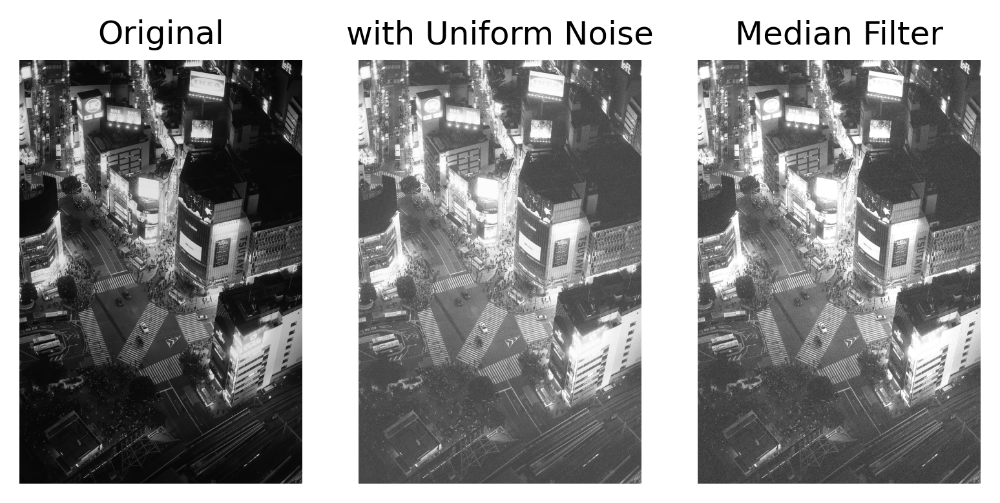

In [ ]:
fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(un_img,cmap='gray')
plt.axis("off")
plt.title("with Uniform Noise")

fig.add_subplot(1,3,3)
plt.imshow(blurred2,cmap='gray')
plt.axis("off")
plt.title("Median Filter")

Text(0.5, 1.0, 'Median Filter')

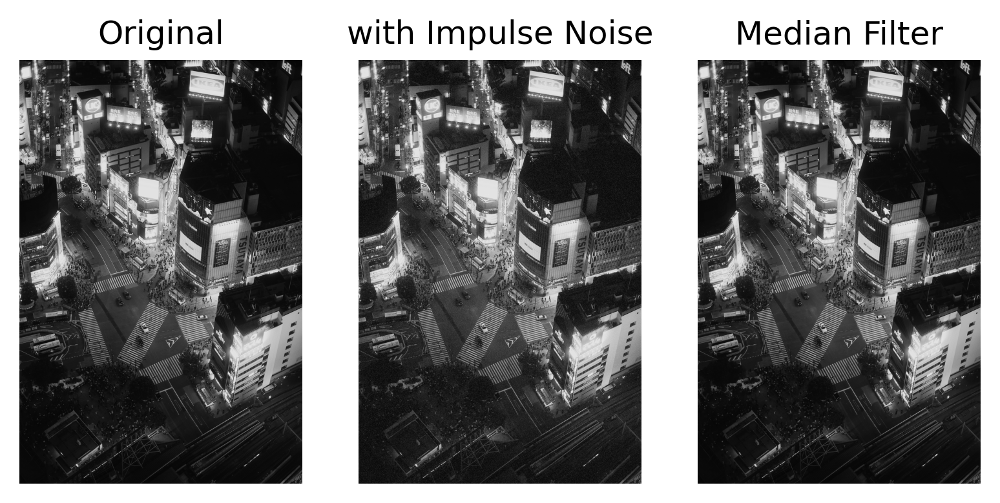

In [ ]:
fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(in_img,cmap='gray')
plt.axis("off")
plt.title("with Impulse Noise")

fig.add_subplot(1,3,3)
plt.imshow(blurred3,cmap='gray')
plt.axis("off")
plt.title("Median Filter")


Inference: Slightly effective against Gaussian Noise, considerably effective against Impulse Noise.


##Gaussian Blur

This method employs a Gaussian Kernel in place of a box filter and is said to be effective against Gaussian Noise.


In [ ]:
blurred21=cv2.GaussianBlur(gn_img,(3,3),0)
blurred22=cv2.GaussianBlur(un_img,(3,3),0)
blurred23=cv2.GaussianBlur(in_img,(3,3),0)

Text(0.5, 1.0, 'Gaussian Filter')

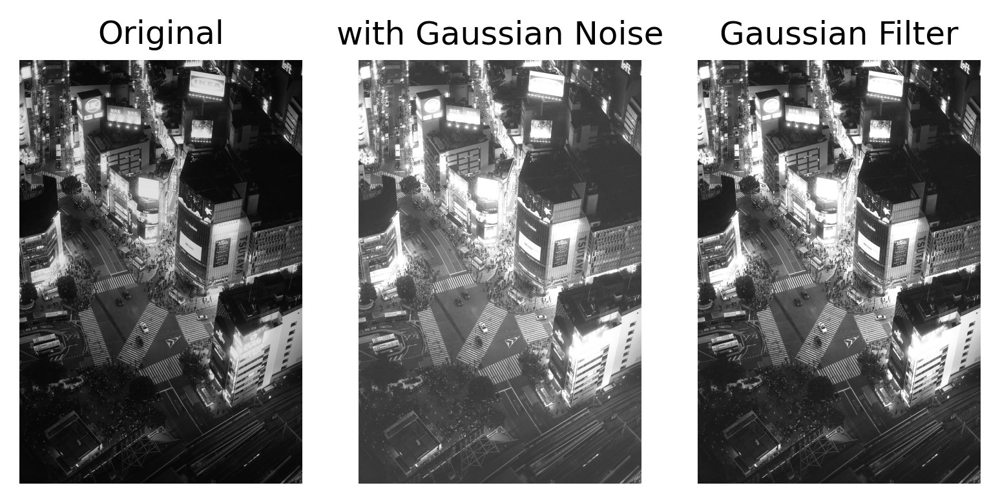

In [ ]:
fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(gn_img,cmap='gray')
plt.axis("off")
plt.title("with Gaussian Noise")

fig.add_subplot(1,3,3)
plt.imshow(blurred21,cmap='gray')
plt.axis("off")
plt.title("Gaussian Filter")

Text(0.5, 1.0, 'Gaussian Filter')

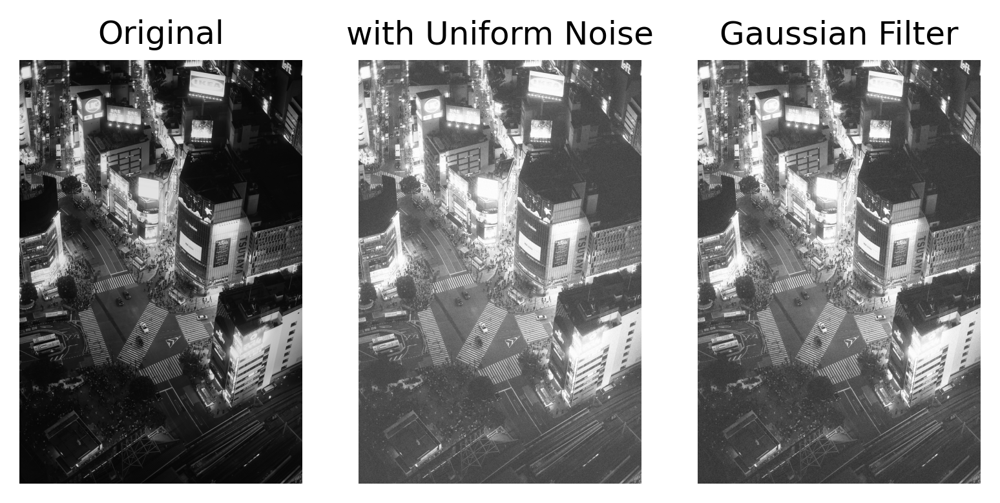

In [ ]:
fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(un_img,cmap='gray')
plt.axis("off")
plt.title("with Uniform Noise")

fig.add_subplot(1,3,3)
plt.imshow(blurred22,cmap='gray')
plt.axis("off")
plt.title("Gaussian Filter")

Text(0.5, 1.0, 'Gaussian Filter')

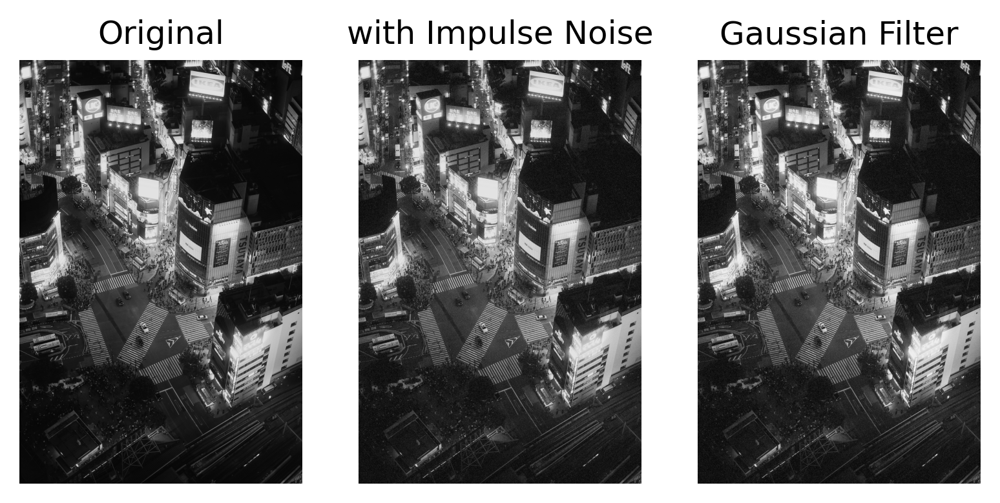

In [ ]:
fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(in_img,cmap='gray')
plt.axis("off")
plt.title("with Impulse Noise")

fig.add_subplot(1,3,3)
plt.imshow(blurred23,cmap='gray')
plt.axis("off")
plt.title("Gaussian Filter")

Inference: Slightly Effective against Gaussian Blur.  Median filter workes better with impulse noise.

In [ ]:
def detect_noise_type(image):

    # Calculate the standard deviation of pixel values
    std_dev = np.std(image)

    # Calculate the minimum and maximum pixel values
    min_val = np.min(image)
    max_val = np.max(image)

    # Determine the type of noise based on statistics
    if std_dev < 15:
        return "Impulse Noise"
    elif std_dev < 50:
        return "Uniform Noise"
    else:
        return "Gaussian Noise"

In [ ]:
# Detect the type of noise
noise_type = detect_noise_type(in_img)

print("Detected Noise Type:", noise_type)

Detected Noise Type: Gaussian Noise


# Creating training Image for Neural network

In [ ]:
def crop_to_480x640(input_image_path, output_image_path):
    # Open the image
    image = Image.open(input_image_path)

    # Ensure the image is at least 480x640 in size
    if image.width < 480 or image.height < 640:
        print("Image is too small to crop to 480x640.")
        return

    # Calculate the cropping coordinates to get a 480x640 area
    left = (image.width - 480) / 2
    top = (image.height - 640) / 2
    right = (image.width + 480) / 2
    bottom = (image.height + 640) / 2

    # Crop the image
    cropped_image = image.crop((left, top, right, bottom))

    # Save the cropped image
    cropped_image.save(output_image_path)

gauss_noise=np.zeros((640,480),dtype=np.uint8)
cv2.randn(gauss_noise,128,20)
gauss_noise=(gauss_noise*0.5).astype(np.uint8)

uni_noise=np.zeros((640,480),dtype=np.uint8)
cv2.randu(uni_noise,0,255)
uni_noise=(uni_noise*0.5).astype(np.uint8)

imp_noise=np.zeros((640,480),dtype=np.uint8)
cv2.randu(imp_noise,0,255)
imp_noise=cv2.threshold(imp_noise,245,255,cv2.THRESH_BINARY)[1]

In [ ]:
input_image_path = "/content/10.jpg"  # Replace with the path to your input image
output_image_path = "10input.jpg"  # Replace with the desired output path
crop_to_480x640(input_image_path, output_image_path)

Image is too small to crop to 480x640.


In [ ]:
img=cv2.imread("/content/10.jpg",0)
print(img.shape) # Has to be (640, 480)

(300, 300)


In [ ]:
# Creating gaussian, uniform, impulse noise
gn_img=cv2.add(img,gauss_noise)
un_img=cv2.add(img,uni_noise)
in_img=cv2.add(img,imp_noise)

cv2.imwrite('Gaussian/gn_img8.jpg', gn_img)
cv2.imwrite(' Uniform/un_img8.jpg', un_img)
cv2.imwrite(' Impulse/in_img8.jpg', in_img)

error: ignored

#Creating Neural Network Model

In [ ]:
pip install tensorflow

In [ ]:
pip install --upgrade tensorflow keras

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 489.8/489.8 MB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 82.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 65.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 91.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.7/440.7 kB 43.4 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.15.0
    Uninstalling wrapt-1.15.0:
      Successfully uninstalled wrapt-1.15.0
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.13.0
    Uninstalling tensorflow-estimator-2.13.0:
      Successfully uninstalled tensorflow-estimator-2.13.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.3.1
    Uninstalling ml-dtypes-0.3.1:
      Successfully uninstalled ml-dtyp

In [ ]:
import tensorflow as tf

In [ ]:
from tensorflow import keras
# Import Keras layers and activations
from tensorflow.keras.layers import *
from tensorflow.keras.activations import *

In [ ]:
def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, filename))
        if img is not None:
            images.append(img)
    return images

# Load and preprocess training images
gaussian_images = load_images_from_folder("Gaussian")
uniform_images = load_images_from_folder("Uniform")
impulse_images = load_images_from_folder("Impulse")

# Create labels for the training data
labels = [0] * 8 + [1] * 8 + [2] * 8  # 0: Gaussian, 1: Uniform, 2: Impulse   #number of Image samples used is 8 can be between 5 - 20

# Combine images and labels, then shuffle
data = np.array(gaussian_images + uniform_images + impulse_images)
labels = np.array(labels)
indices = np.arange(data.shape[0])
np.random.shuffle(indices)
data = data[indices]
labels = labels[indices]

# Normalize pixel values to [0, 1]
data = data / 255.0

# Create a CNN model
model = keras.Sequential([
    keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(640, 480, 3)),
    keras.layers.MaxPooling2D((2, 2)),
    keras.layers.Flatten(),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(3, activation='softmax')  # Three classes: Gaussian, Uniform, Impulse
])

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
model.fit(data, labels, epochs=10)  # You can adjust the number of epochs

# Save the trained model for future use
model.save("noise_classifier_model.h5")

FileNotFoundError: ignored

In [ ]:
def detect_noise_type_model(image_path, model_path):
    # Load the trained model
    model = keras.models.load_model(model_path)

    # Load and preprocess the input image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB format
    #image = cv2.resize(image, (640, 480))  # Resize to match the training image size
    image = image / 255.0  # Normalize pixel values

    # Make a prediction on the input image
    predictions = model.predict(np.array([image]))

    # Get the class label with the highest probability
    predicted_class = np.argmax(predictions)

    # Define class labels for the noise types
    noise_classes = ["Gaussian", "Uniform", "Impulse"]

    # Return the predicted noise type
    return noise_classes[predicted_class]

In [ ]:
# Specify the path to the trained model file
model_path = "noise_classifier_model.h5"

In [ ]:
# Call the function to detect the noise type in the input image
predicted_noise_type = detect_noise_type_model('Gaussian/gn_img5.jpg', model_path)
print("Predicted Noise Type:", predicted_noise_type)

In [ ]:
# Call the function to detect the noise type in the input image
predicted_noise_type = detect_noise_type_model('Uniform/un_img1.jpg', model_path)
print("Predicted Noise Type:", predicted_noise_type)

In [ ]:
# Call the function to detect the noise type in the input image
predicted_noise_type = detect_noise_type_model('Uniform/un_img3.jpg', model_path)
print("Predicted Noise Type:", predicted_noise_type)